# Calculate seasonal surface flux trends at all Arctic points

* **Description**: Reads in and creates spatial plots of wind trends
* **Input data**: CESM2-LE and Rufmod output in timeseries format
* **Output data**: PNG figures of trends
* **Creator**: Alice DuVivier
* **Date**: March 2022

The rufmod experiments were performed where the sea ice roughness over Arctic sea ice regions was set to be equal to what it would be over open ocean. This is to better understand ice-atmosphere coupling, processes, and feedbacks.

In [1]:
import xarray as xr
import numpy as np
from datetime import timedelta
import glob

import pop_tools

import matplotlib.pyplot as plt
import matplotlib.path as mpath
from matplotlib.gridspec import GridSpec

import geocat.datafiles as gdf
import geocat.viz.util as gvutil
from geocat.viz import cmaps as gvcmaps
import geocat.comp as gcomp

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import linregress,pearsonr, t

import dask
import intake
from distributed import Client
from ncar_jobqueue import NCARCluster

/glade/work/duvivier/miniconda3/envs/analysis3/lib/python3.7/site-packages/dask_jobqueue/core.py:20: FutureWarning: tmpfile is deprecated and will be removed in a future release. Please use dask.utils.tmpfile instead.
  from distributed.utils import tmpfile


In [2]:
# spin up dask cluster

import dask

# Use dask jobqueue
from dask_jobqueue import PBSCluster

# Import a client
from dask.distributed import Client

# Setup your PBSCluster
cluster = PBSCluster(
    cores=2, # The number of cores you want
    memory='32 GB', # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='$TMPDIR', # Use your local directory
    #resource_spec='select=1:ncpus=2:mem=256GB', # Specify resources
    project='P93300665', # Input your project ID here
    walltime='04:00:00', # Amount of wall time
    interface='ib0', # Interface to use
)
# Scale up
cluster.scale(32)

# Change your url to the dask dashboard so you can see it
dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'})

# Setup your client
client = Client(cluster)

In [3]:
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/duvivier/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/duvivier/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.63:36513,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/duvivier/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Manually set variables

In [124]:
# list the variables to load
var_in = 'SHFLX'
# 'PBLH', 'LHFLX', 'SHFLX'

#set some labeling info for plots
#label = 'Planetary Boundary Layer Height'
#units = 'm'
label = 'Sensible Heat Flux'
#label = 'Latent Heat Flux'
units = 'W/m2'

## Load rufmod experiments

In [125]:
# Load "rufmod" data
#choose cases and data paths
case1 = 'b.e21.BSSP370.f09_g17.rufmod.001'
case2 = 'b.e21.BSSP370.f09_g17.rufmod.002'
case3 = 'b.e21.BSSP370.f09_g17.rufmod.003'
case4 = 'b.e21.BSSP370.f09_g17.rufmod.004'
case5 = 'b.e21.BSSP370.f09_g17.rufmod.005'

# set base directory where all data live
data_dir = '/glade/campaign/cesm/development/pcwg/duvivier/arctic_cyclones/'
# set individual data directories
data_dir1 = data_dir+case1+'/atm/proc/tseries/month_1/'
data_dir2 = data_dir+case2+'/atm/proc/tseries/month_1/'
data_dir3 = data_dir+case3+'/atm/proc/tseries/month_1/'
data_dir4 = data_dir+case4+'/atm/proc/tseries/month_1/'
data_dir5 = data_dir+case5+'/atm/proc/tseries/month_1/'

In [126]:
%%time
#reading in files
print("loading "+var_in)   
ds1_1 = []
ds2_1 = []
ds3_1 = []
ds4_1 = []
ds5_1 = []
my_files=sorted(glob.glob(data_dir1+case1+'.cam.h0.'+var_in+'.*.nc'))
ds1_1=xr.open_mfdataset(my_files,combine='by_coords',chunks={}, parallel=True, compat='override', coords='minimal')
my_files=sorted(glob.glob(data_dir2+case2+'.cam.h0.'+var_in+'.*.nc'))
ds2_1=xr.open_mfdataset(my_files,combine='by_coords',chunks={}, parallel=True, compat='override', coords='minimal')
my_files=sorted(glob.glob(data_dir3+case3+'.cam.h0.'+var_in+'.*.nc'))
ds3_1=xr.open_mfdataset(my_files,combine='by_coords',chunks={}, parallel=True, compat='override', coords='minimal')    
my_files=sorted(glob.glob(data_dir4+case4+'.cam.h0.'+var_in+'.*.nc'))
ds4_1=xr.open_mfdataset(my_files,combine='by_coords',chunks={}, parallel=True, compat='override', coords='minimal')
my_files=sorted(glob.glob(data_dir5+case5+'.cam.h0.'+var_in+'.*.nc'))
ds5_1=xr.open_mfdataset(my_files,combine='by_coords',chunks={}, parallel=True, compat='override', coords='minimal')

loading SHFLX
CPU times: user 312 ms, sys: 21 ms, total: 333 ms
Wall time: 1.56 s


In [127]:
# concatenate them into a single array
futures_1 = xr.concat([ds1_1,ds2_1,ds3_1,ds4_1,ds5_1],dim='member_id')

In [128]:
# set member_id values
futures_1.member_id.values

# assign member_id as coordinate array
futures_1.assign_coords({"member_id": futures_1.member_id.values})

<xarray.Dataset>
Dimensions:       (lat: 192, zlon: 1, member_id: 5, time: 1032, nbnd: 2, lon: 288, lev: 32, ilev: 33)
Coordinates:
  * lat           (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * zlon          (zlon) float64 0.0
  * lon           (lon) float64 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lev           (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev          (ilev) float64 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * time          (time) object 2015-02-01 00:00:00 ... 2101-01-01 00:00:00
  * member_id     (member_id) int64 0 1 2 3 4
Dimensions without coordinates: nbnd
Data variables: (12/27)
    zlon_bnds     (member_id, time, zlon, nbnd) float64 dask.array<chunksize=(1, 600, 1, 2), meta=np.ndarray>
    gw            (member_id, time, lat) float64 dask.array<chunksize=(1, 600, 192), meta=np.ndarray>
    hyam          (member_id, time, lev) float64 dask.array<chunksize=(1, 600, 32), meta=np.ndarray>
    hybm          (member_id, time, lev) float64 dask.array<chunksize=(1, 600, 32), meta=np.ndarray>
    P0            (member_id, time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05
    hyai          (member_id, time, ilev) float64 dask.array<chunksize=(1, 600, 33), meta=np.ndarray>
    ...            ...
    n2ovmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    f11vmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    f12vmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    sol_tsi       (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    nsteph        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    SHFLX         (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 600, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e21.BSSP370.f09_g17.rufmod.001
    logname:           duvivier
    host:              cheyenne3
    initial_file:      b.e21.BHIST.f09_g17.CMIP6-historical.rufmod.cam.i.2015...
    topography_file:   /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/fv_0.9x1...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  month_1

In [129]:
futures_1

<xarray.Dataset>
Dimensions:       (lat: 192, zlon: 1, member_id: 5, time: 1032, nbnd: 2, lon: 288, lev: 32, ilev: 33)
Coordinates:
  * lat           (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * zlon          (zlon) float64 0.0
  * lon           (lon) float64 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lev           (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev          (ilev) float64 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * time          (time) object 2015-02-01 00:00:00 ... 2101-01-01 00:00:00
Dimensions without coordinates: member_id, nbnd
Data variables: (12/27)
    zlon_bnds     (member_id, time, zlon, nbnd) float64 dask.array<chunksize=(1, 600, 1, 2), meta=np.ndarray>
    gw            (member_id, time, lat) float64 dask.array<chunksize=(1, 600, 192), meta=np.ndarray>
    hyam          (member_id, time, lev) float64 dask.array<chunksize=(1, 600, 32), meta=np.ndarray>
    hybm          (member_id, time, lev) float64 dask.array<chunksize=(1, 600, 32), meta=np.ndarray>
    P0            (member_id, time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05
    hyai          (member_id, time, ilev) float64 dask.array<chunksize=(1, 600, 33), meta=np.ndarray>
    ...            ...
    n2ovmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    f11vmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    f12vmr        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    sol_tsi       (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    nsteph        (member_id, time) float64 dask.array<chunksize=(1, 600), meta=np.ndarray>
    SHFLX         (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 600, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e21.BSSP370.f09_g17.rufmod.001
    logname:           duvivier
    host:              cheyenne3
    initial_file:      b.e21.BHIST.f09_g17.CMIP6-historical.rufmod.cam.i.2015...
    topography_file:   /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/fv_0.9x1...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  month_1

In [130]:
# Shift months by one to be center of time period.
# Take average of the time bounds to get middle of month
# will lose some attributes with time, so may need to put this back in later...
futures_1['time'] = futures_1.time_bnds.load().mean(dim='nbnd').sel(member_id=0)

In [131]:
futures_1.time

<xarray.DataArray 'time' (time: 1032)>
array([cftime.DatetimeNoLeap(2015, 1, 16, 12, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2015, 2, 15, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2015, 3, 16, 12, 0, 0, 0, has_year_zero=True),
       ...,
       cftime.DatetimeNoLeap(2100, 10, 16, 12, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2100, 11, 16, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2100, 12, 16, 12, 0, 0, 0, has_year_zero=True)],
      dtype=object)
Coordinates:
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    long_name:  time interval endpoints

In [132]:
flux_rufmod = futures_1[var_in]

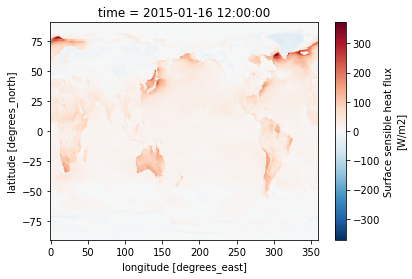

In [133]:
flux_rufmod.sel(member_id=0).isel(time=0).plot()

## Read the CESM-LE data 

We will use [`intake-esm`](https://intake-esm.readthedocs.io/en/latest/), which is a data catalog tool.
It enables querying a database for the files we want, then loading those directly as an `xarray.Dataset`.

First step is to set the "collection" for the CESM-LE, which depends on a json file conforming to the [ESM Catalog Specification](https://github.com/NCAR/esm-collection-spec).

In [134]:
catalog_file = '/glade/collections/cmip/catalog/intake-esm-datastore/catalogs/glade-cesm2-le.json'

cat = intake.open_esm_datastore(catalog_file)

/glade/work/duvivier/miniconda3/envs/analysis3/lib/python3.7/site-packages/intake_esm/core.py:84: DtypeWarning: Columns (5,6,9) have mixed types.Specify dtype option on import or set low_memory=False.
  self._df, self.catalog_file = _fetch_catalog(self.esmcol_data, esmcol_obj, csv_kwargs)


In [135]:
forcing = 'cmip6'  # do not want smbb data
expt = 'ssp370'
comp = 'atm'
freq = 'month_1'

subset_1 = cat.search(variable=var_in, forcing_variant=forcing, experiment=expt, component=comp, frequency=freq )

In [136]:
subset_1

,unique
component,1
stream,1
case,50
member_id,50
variable,1
start_time,9
end_time,9
time_range,9
long_name,1
units,1


In [137]:
subset_1.df.head()

,component,stream,case,member_id,variable,start_time,end_time,time_range,long_name,units,vertical_levels,frequency,path,experiment,forcing_variant,cesm_member_id,control_branch_year,cmip_experiment_id
0,atm,cam.h0,b.e21.BSSP370cmip6.f09_g17.LE2-1001.001,r1i1001p1f1,SHFLX,2015-01,2024-12,201501-202412,Surface sensible heat flux,W/m2,1.0,month_1,/glade/campaign/cgd/cesm/CESM2-LE/timeseries/a...,ssp370,cmip6,1001.001,1001,CESM2_ssp370_r1i1001p1f1
1,atm,cam.h0,b.e21.BSSP370cmip6.f09_g17.LE2-1001.001,r1i1001p1f1,SHFLX,2025-01,2034-12,202501-203412,Surface sensible heat flux,W/m2,1.0,month_1,/glade/campaign/cgd/cesm/CESM2-LE/timeseries/a...,ssp370,cmip6,1001.001,1001,CESM2_ssp370_r1i1001p1f1
2,atm,cam.h0,b.e21.BSSP370cmip6.f09_g17.LE2-1001.001,r1i1001p1f1,SHFLX,2035-01,2044-12,203501-204412,Surface sensible heat flux,W/m2,1.0,month_1,/glade/campaign/cgd/cesm/CESM2-LE/timeseries/a...,ssp370,cmip6,1001.001,1001,CESM2_ssp370_r1i1001p1f1
3,atm,cam.h0,b.e21.BSSP370cmip6.f09_g17.LE2-1001.001,r1i1001p1f1,SHFLX,2045-01,2054-12,204501-205412,Surface sensible heat flux,W/m2,1.0,month_1,/glade/campaign/cgd/cesm/CESM2-LE/timeseries/a...,ssp370,cmip6,1001.001,1001,CESM2_ssp370_r1i1001p1f1
4,atm,cam.h0,b.e21.BSSP370cmip6.f09_g17.LE2-1001.001,r1i1001p1f1,SHFLX,2055-01,2064-12,205501-206412,Surface sensible heat flux,W/m2,1.0,month_1,/glade/campaign/cgd/cesm/CESM2-LE/timeseries/a...,ssp370,cmip6,1001.001,1001,CESM2_ssp370_r1i1001p1f1


In [138]:
# check that we only have cmip6, not smbb, data
member_id = list(subset_1.df.experiment.unique())
print(member_id)

['ssp370']


In [139]:
%%time
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    dsets_1 = subset_1.to_dataset_dict(cdf_kwargs={'chunks': {'time':240}, 'decode_times': True})


--> The keys in the returned dictionary of datasets are constructed as follows:
	'component.experiment.stream.forcing_variant.variable'


CPU times: user 7.18 s, sys: 145 ms, total: 7.33 s
Wall time: 8.43 s


In [140]:
# load in the future datasets
futures_1 = []
for key in sorted(dsets_1.keys()):
    futures_1.append(dsets_1[key])
    print(key)
    

atm.ssp370.cam.h0.cmip6.SHFLX


In [141]:
future_ds_1 = xr.concat(futures_1, dim='member_id')

In [142]:
future_ds_1.time

<xarray.DataArray 'time' (time: 1032)>
array([cftime.DatetimeNoLeap(2015, 2, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2015, 3, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2015, 4, 1, 0, 0, 0, 0, has_year_zero=True), ...,
       cftime.DatetimeNoLeap(2100, 11, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2100, 12, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2101, 1, 1, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)
Coordinates:
  * time     (time) object 2015-02-01 00:00:00 ... 2101-01-01 00:00:00
Attributes:
    long_name:  time
    bounds:     time_bnds

In [143]:
# Shift months by one to be center of time period.
# Take average of the time bounds to get middle of month
# will lose some attributes with time, so may need to put this back in later...
future_ds_1['time'] = future_ds_1.time_bnds.load().mean(dim='nbnd').sel(member_id='r1i1281p1f1')

In [144]:
flux_le = future_ds_1[var_in]

In [145]:
flux_le.persist()

,Array,Chunk
Bytes,10.63 GiB,25.31 MiB
Shape,"(50, 1032, 192, 288)","(1, 120, 192, 288)"
Count,450 Tasks,450 Chunks
Type,float32,numpy.ndarray


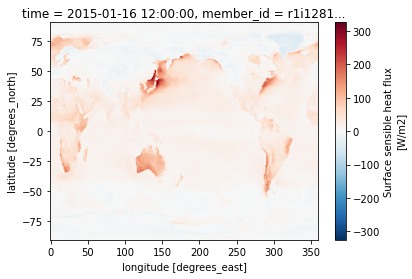

In [146]:
flux_le.sel(member_id='r1i1281p1f1').isel(time=0).plot()

## Mask NH and Land, then load data

In [147]:
ds_masks = xr.open_mfdataset('/glade/p/cgd/ppc/duvivier/masks/b.e21.BSSP370.f09_g17.rufmod.001.cam.h0.2015-01.nc')
my_mask = ds_masks['LANDFRAC'].isel(time=0)

In [148]:
# set mask lat/lon to equal those from LE, otherwise masking below doesn't work properly
my_mask['lat'] = flux_le['lat']
my_mask['lon'] = flux_le['lon']

flux_rufmod['lat'] = flux_le['lat']
flux_rufmod['lon'] = flux_le['lon']

In [149]:
#mask just NH ocean points
flux_masked_le = flux_le.where((flux_le['lat']>70.0) & (my_mask<0.5), drop=True)
flux_masked_rufmod = flux_rufmod.where((flux_rufmod['lat']>70.0) & (my_mask<0.5), drop=True)

/glade/work/duvivier/miniconda3/envs/analysis3/lib/python3.7/site-packages/xarray/core/indexing.py:1227: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


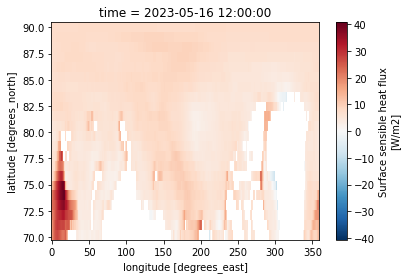

In [150]:
# test simple plot
flux_masked_rufmod.sel(member_id=0).isel(time=100).plot()

In [151]:
# Actually load data
flux_masked_rufmod.load()
flux_masked_le.load()

<xarray.DataArray 'SHFLX' (member_id: 50, time: 1032, lat: 22, lon: 288)>
array([[[[ 7.21086426e+01,  7.28892288e+01,  7.38983154e+01, ...,
           7.25181274e+01,  7.11085129e+01,  7.13370743e+01],
         [ 7.33811340e+01,  7.43145523e+01,  7.52789459e+01, ...,
           7.82616577e+01,  7.44149551e+01,  7.30570297e+01],
         [ 7.46187668e+01,  7.60154724e+01,  7.76923141e+01, ...,
           8.62849731e+01,  7.89635849e+01,  7.50352783e+01],
         ...,
         [-1.03772581e+00, -1.06300175e+00, -1.07244349e+00, ...,
          -8.64884436e-01, -9.23779964e-01, -9.81258810e-01],
         [-1.12945402e+00, -1.19420540e+00, -1.26003695e+00, ...,
          -9.57223415e-01, -1.00192654e+00, -1.06392932e+00],
         [-1.08870816e+00, -1.08520567e+00, -1.08203566e+00, ...,
          -1.10164130e+00, -1.09687531e+00, -1.09258246e+00]],

        [[ 8.72490158e+01,  8.80775146e+01,  8.81175003e+01, ...,
           7.93068771e+01,  8.18640366e+01,  8.48995895e+01],
         [ 9.00858383e+01,  9.26453705e+01,  9.26618729e+01, ...,
           7.68980255e+01,  7.93939972e+01,  8.42188568e+01],
         [ 8.46132202e+01,  9.03546906e+01,  9.23779373e+01, ...,
           7.53608170e+01,  7.50162964e+01,  7.88216324e+01],
...
           2.87386727e+00,  2.81604147e+00,  2.76276612e+00],
         [ 3.99306297e+00,  3.97427917e+00,  3.95567298e+00, ...,
           4.06711292e+00,  4.03941965e+00,  4.01473045e+00],
         [ 5.09911108e+00,  5.09594917e+00,  5.09307480e+00, ...,
           5.11070871e+00,  5.10644531e+00,  5.10259581e+00]],

        [[ 3.40024300e+01,  3.61095085e+01,  3.82925644e+01, ...,
           2.71222992e+01,  2.97394581e+01,  3.20877037e+01],
         [ 3.42542038e+01,  3.64297333e+01,  3.88408661e+01, ...,
           2.66748829e+01,  2.93499966e+01,  3.17151279e+01],
         [ 3.35814285e+01,  3.62457504e+01,  3.84228363e+01, ...,
           2.66441174e+01,  2.86350727e+01,  3.11469994e+01],
         ...,
         [ 1.77008839e+01,  1.79601898e+01,  1.82202168e+01, ...,
           1.70815487e+01,  1.72822208e+01,  1.74775543e+01],
         [ 1.56064119e+01,  1.57210445e+01,  1.58353901e+01, ...,
           1.52578678e+01,  1.53592968e+01,  1.54833946e+01],
         [ 1.17548742e+01,  1.17728157e+01,  1.17892332e+01, ...,
           1.16897421e+01,  1.17135887e+01,  1.17352095e+01]]]],
      dtype=float32)
Coordinates:
  * lat        (lat) float64 70.21 71.15 72.09 73.04 ... 87.17 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * member_id  (member_id) <U12 'r10i1181p1f1' 'r10i1231p1f1' ... 'r9i1301p1f1'
Attributes:
    units:         W/m2
    long_name:     Surface sensible heat flux
    cell_methods:  time: mean

## Calculate seasonal means

In [152]:
season_names = ['OND','JFM', 'AMJ', 'JAS']

In [153]:
# find total years
xarr_le = flux_masked_le.coords['time.year'][(flux_masked_le.coords['time.month']==1)]
xarr_rufmod = flux_masked_rufmod.coords['time.year'][(flux_masked_rufmod.coords['time.month']==1)]

In [154]:
# Loop through seasons - rufmod

# make numpy array to fill and specify dimensions we want
seas_array_rufmod = np.zeros([len(season_names),len(xarr_rufmod),len(flux_masked_rufmod.member_id),len(flux_masked_rufmod.lat),len(flux_masked_rufmod.lon)])

for ss in season_names:
    print(ss)
    if ss == 'OND':
        s_count = 0
    else: 
        s_count = s_count+1
    # get temporary array of just these month by season
    if ss == 'JFM':
        temp1 = flux_masked_rufmod.isel(time=flux_masked_rufmod.time.dt.month.isin([1,2,3]))
    if ss == 'AMJ':
        temp1 = flux_masked_rufmod.isel(time=flux_masked_rufmod.time.dt.month.isin([4,5,6]))
    if ss == 'JAS':
        temp1 = flux_masked_rufmod.isel(time=flux_masked_rufmod.time.dt.month.isin([7,8,9]))
    if ss == 'OND':
        temp1 = flux_masked_rufmod.isel(time=flux_masked_rufmod.time.dt.month.isin([10,11,12]))
    # now loop through years to get the seasonal average by year for each ensemble member
    for yy in xarr_rufmod:
        if yy == 2015:
            y_count = 0
        else: 
            y_count = y_count+1 
        # select only the indexes for this year
        temp2 = temp1.isel(time=temp1.time.dt.year.isin([yy]))
        temp3 = temp2.mean(dim='time')
        seas_array_rufmod[s_count,y_count,:,:,:] = temp3    


OND
JFM
AMJ
JAS


In [155]:
# Loop through seasons - CESM2-LE

# make numpy array to fill and specify dimensions we want
seas_array_le = np.zeros([len(season_names),len(xarr_le),len(flux_masked_le.member_id),len(flux_masked_le.lat),len(flux_masked_le.lon)])

for ss in season_names:
    print(ss)
    if ss == 'OND':
        s_count = 0
    else: 
        s_count = s_count+1
    # get temporary array of just these month by season
    if ss == 'JFM':
        temp1 = flux_masked_le.isel(time=flux_masked_le.time.dt.month.isin([1,2,3]))
    if ss == 'AMJ':
        temp1 = flux_masked_le.isel(time=flux_masked_le.time.dt.month.isin([4,5,6]))
    if ss == 'JAS':
        temp1 = flux_masked_le.isel(time=flux_masked_le.time.dt.month.isin([7,8,9]))
    if ss == 'OND':
        temp1 = flux_masked_le.isel(time=flux_masked_le.time.dt.month.isin([10,11,12]))
    # now loop through years to get the seasonal average by year for each ensemble member
    for yy in xarr_le:
        if yy == 2015:
            y_count = 0
        else: 
            y_count = y_count+1 
        # select only the indexes for this year
        temp2 = temp1.isel(time=temp1.time.dt.year.isin([yy]))
        temp3 = temp2.mean(dim='time')
        seas_array_le[s_count,y_count,:,:,:] = temp3    


OND
JFM
AMJ
JAS


In [156]:
print(seas_array_le.shape)
print(seas_array_rufmod.shape)

(4, 86, 50, 22, 288)
(4, 86, 5, 22, 288)


In [157]:
flux_masked_le

<xarray.DataArray 'SHFLX' (member_id: 50, time: 1032, lat: 22, lon: 288)>
array([[[[ 7.21086426e+01,  7.28892288e+01,  7.38983154e+01, ...,
           7.25181274e+01,  7.11085129e+01,  7.13370743e+01],
         [ 7.33811340e+01,  7.43145523e+01,  7.52789459e+01, ...,
           7.82616577e+01,  7.44149551e+01,  7.30570297e+01],
         [ 7.46187668e+01,  7.60154724e+01,  7.76923141e+01, ...,
           8.62849731e+01,  7.89635849e+01,  7.50352783e+01],
         ...,
         [-1.03772581e+00, -1.06300175e+00, -1.07244349e+00, ...,
          -8.64884436e-01, -9.23779964e-01, -9.81258810e-01],
         [-1.12945402e+00, -1.19420540e+00, -1.26003695e+00, ...,
          -9.57223415e-01, -1.00192654e+00, -1.06392932e+00],
         [-1.08870816e+00, -1.08520567e+00, -1.08203566e+00, ...,
          -1.10164130e+00, -1.09687531e+00, -1.09258246e+00]],

        [[ 8.72490158e+01,  8.80775146e+01,  8.81175003e+01, ...,
           7.93068771e+01,  8.18640366e+01,  8.48995895e+01],
         [ 9.00858383e+01,  9.26453705e+01,  9.26618729e+01, ...,
           7.68980255e+01,  7.93939972e+01,  8.42188568e+01],
         [ 8.46132202e+01,  9.03546906e+01,  9.23779373e+01, ...,
           7.53608170e+01,  7.50162964e+01,  7.88216324e+01],
...
           2.87386727e+00,  2.81604147e+00,  2.76276612e+00],
         [ 3.99306297e+00,  3.97427917e+00,  3.95567298e+00, ...,
           4.06711292e+00,  4.03941965e+00,  4.01473045e+00],
         [ 5.09911108e+00,  5.09594917e+00,  5.09307480e+00, ...,
           5.11070871e+00,  5.10644531e+00,  5.10259581e+00]],

        [[ 3.40024300e+01,  3.61095085e+01,  3.82925644e+01, ...,
           2.71222992e+01,  2.97394581e+01,  3.20877037e+01],
         [ 3.42542038e+01,  3.64297333e+01,  3.88408661e+01, ...,
           2.66748829e+01,  2.93499966e+01,  3.17151279e+01],
         [ 3.35814285e+01,  3.62457504e+01,  3.84228363e+01, ...,
           2.66441174e+01,  2.86350727e+01,  3.11469994e+01],
         ...,
         [ 1.77008839e+01,  1.79601898e+01,  1.82202168e+01, ...,
           1.70815487e+01,  1.72822208e+01,  1.74775543e+01],
         [ 1.56064119e+01,  1.57210445e+01,  1.58353901e+01, ...,
           1.52578678e+01,  1.53592968e+01,  1.54833946e+01],
         [ 1.17548742e+01,  1.17728157e+01,  1.17892332e+01, ...,
           1.16897421e+01,  1.17135887e+01,  1.17352095e+01]]]],
      dtype=float32)
Coordinates:
  * lat        (lat) float64 70.21 71.15 72.09 73.04 ... 87.17 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * member_id  (member_id) <U12 'r10i1181p1f1' 'r10i1231p1f1' ... 'r9i1301p1f1'
Attributes:
    units:         W/m2
    long_name:     Surface sensible heat flux
    cell_methods:  time: mean

In [158]:
# convert the numpy array to a xarray for easier plotting
flux_seas_le = xr.DataArray(seas_array_le,dims=('season','time','member_id','lat','lon'))
flux_seas_rufmod = xr.DataArray(seas_array_rufmod,dims=('season','time','member_id','lat','lon'))

In [159]:
# set coordinate arrays
flux_seas_le['season'] = season_names
flux_seas_le['time'] = xarr_le
flux_seas_le['member_id'] = flux_masked_le['member_id']
flux_seas_le['lat'] = flux_masked_le['lat'].values
flux_seas_le['lon'] = flux_masked_le['lon'].values

flux_seas_rufmod['season'] = season_names
flux_seas_rufmod['time'] = xarr_rufmod
flux_seas_rufmod['member_id'] = flux_masked_rufmod['member_id']
flux_seas_rufmod['lat'] = flux_masked_rufmod['lat'].values
flux_seas_rufmod['lon'] = flux_masked_rufmod['lon'].values

## Calculate decadal and ensemble means

In [160]:
flux_seas_le.time

<xarray.DataArray 'time' (time: 86)>
array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026,
       2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036, 2037, 2038,
       2039, 2040, 2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050,
       2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2059, 2060, 2061, 2062,
       2063, 2064, 2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 2074,
       2075, 2076, 2077, 2078, 2079, 2080, 2081, 2082, 2083, 2084, 2085, 2086,
       2087, 2088, 2089, 2090, 2091, 2092, 2093, 2094, 2095, 2096, 2097, 2098,
       2099, 2100])
Coordinates:
  * time     (time) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100

In [161]:
#specify some arrays that will become coordinate arrays
decades = list(range(2020,2100,10))
decade_names = ['2020','2030','2040','2050','2060','2070','2080','2090']

In [162]:
decades

[2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]

In [163]:
flux_seas_rufmod

<xarray.DataArray (season: 4, time: 86, member_id: 5, lat: 22, lon: 288)>
array([[[[[ 3.78249016e+01,  3.86170311e+01,  3.96014671e+01, ...,
            3.67496872e+01,  3.72360725e+01,  3.74487038e+01],
          [ 3.78273125e+01,  3.75922203e+01,  3.81849251e+01, ...,
            3.84551659e+01,  3.86104546e+01,  3.83896637e+01],
          [ 3.83871918e+01,  3.77015533e+01,  3.80536613e+01, ...,
            4.06840706e+01,  4.00148430e+01,  3.91847343e+01],
          ...,
          [ 1.50047064e-01,  1.74537078e-01,  1.99952856e-01, ...,
            8.43610987e-02,  1.08104669e-01,  1.27589941e-01],
          [ 6.07010901e-01,  6.03985786e-01,  6.02026641e-01, ...,
            6.09063566e-01,  6.15063727e-01,  6.11628532e-01],
          [ 1.38534164e+00,  1.38495207e+00,  1.38459635e+00, ...,
            1.38675976e+00,  1.38624001e+00,  1.38576925e+00]],

         [[ 1.73350353e+01,  1.76860905e+01,  1.80922527e+01, ...,
            1.76753311e+01,  1.71761494e+01,  1.71926479e+01],
          [ 1.55300913e+01,  1.55480499e+01,  1.59291735e+01, ...,
            1.62339325e+01,  1.57435961e+01,  1.54881163e+01],
          [ 1.28588486e+01,  1.28377409e+01,  1.29411469e+01, ...,
            1.47285318e+01,  1.35499411e+01,  1.31177111e+01],
...
          [ 3.78029138e-01,  3.58537078e-01,  3.39343578e-01, ...,
            4.25235271e-01,  4.09707993e-01,  3.94657701e-01],
          [ 6.85568631e-01,  6.75414622e-01,  6.64807141e-01, ...,
            7.20515072e-01,  7.08032846e-01,  6.96409702e-01],
          [ 8.86987209e-01,  8.85713518e-01,  8.84547472e-01, ...,
            8.91608953e-01,  8.89917076e-01,  8.88382971e-01]],

         [[ 5.75846720e+00,  5.83623075e+00,  5.85559893e+00, ...,
            4.74581003e+00,  5.17457199e+00,  5.54405355e+00],
          [ 5.87307549e+00,  6.03550100e+00,  6.10238266e+00, ...,
            4.67136717e+00,  5.20812035e+00,  5.60000038e+00],
          [ 6.32462168e+00,  6.70828104e+00,  6.89166784e+00, ...,
            4.59029388e+00,  5.21874952e+00,  5.86969757e+00],
          ...,
          [-6.03923388e-02, -5.92716932e-02, -5.99185228e-02, ...,
           -6.46516457e-02, -6.24016114e-02, -6.17432594e-02],
          [-4.22257394e-01, -4.25020784e-01, -4.27602679e-01, ...,
           -4.15694714e-01, -4.17401195e-01, -4.19688433e-01],
          [-4.58955288e-01, -4.59531307e-01, -4.60057169e-01, ...,
           -4.56856757e-01, -4.57626194e-01, -4.58322763e-01]]]]])
Coordinates:
  * season     (season) <U3 'OND' 'JFM' 'AMJ' 'JAS'
  * time       (time) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
  * member_id  (member_id) int64 0 1 2 3 4
  * lat        (lat) float64 70.21 71.15 72.09 73.04 ... 87.17 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8

In [164]:
# Loop through seasons - rufmod
print('Calculating Decadal and Ensemble Means - SMOOTH')

# make numpy array to fill and specify dimensions we want
seas_array_rufmod = np.zeros([len(season_names),len(decades),len(flux_seas_rufmod.lat),len(flux_seas_rufmod.lon)])

# decade loop
for dec in decades:
    print('Calculating decadal means for '+str(dec)+'s')
    # need to specify which spot in the array we'll fill for the decade
    if dec == 2020:
        y_count = 0
    else: 
        y_count = y_count+1
    # set the start and end years for this decade
    yy_st = dec
    yy_ed = yy_st + 10
    yy = list(range(yy_st,yy_ed,1))
    # subset the data for these years only but keep all months
    temp1 = flux_seas_rufmod.isel(time=flux_seas_rufmod.time.isin([yy]))
    
    # season loop
    for ss in season_names:
        if ss == 'OND':
            s_count = 0
        else: 
            s_count = s_count+1
        #select the season, stack so we can average over years and ensembles at once
        temp1a = temp1[s_count,:,:,:,:]
        temp1b = temp1a.stack(all_times=("time","member_id"))
        seas_array_rufmod[s_count,y_count,:,:] = temp1b.mean(dim='all_times')


Calculating Decadal and Ensemble Means - SMOOTH
Calculating decadal means for 2020s
Calculating decadal means for 2030s
Calculating decadal means for 2040s
Calculating decadal means for 2050s
Calculating decadal means for 2060s
Calculating decadal means for 2070s
Calculating decadal means for 2080s
Calculating decadal means for 2090s


In [165]:
# Loop through seasons - rufmod
print('Calculating Decadal and Ensemble Means - CESM2-LE')

# make numpy array to fill and specify dimensions we want
seas_array_le = np.zeros([len(season_names),len(decades),len(flux_seas_le.lat),len(flux_seas_le.lon)])

# decade loop
for dec in decades:
    print('Calculating decadal means for '+str(dec)+'s')
    # need to specify which spot in the array we'll fill for the decade
    if dec == 2020:
        y_count = 0
    else: 
        y_count = y_count+1
    # set the start and end years for this decade
    yy_st = dec
    yy_ed = yy_st + 10
    yy = list(range(yy_st,yy_ed,1))
    # subset the data for these years only but keep all months
    temp1 = flux_seas_le.isel(time=flux_seas_le.time.isin([yy]))
    
    # season loop
    for ss in season_names:
        if ss == 'OND':
            s_count = 0
        else: 
            s_count = s_count+1
        #select the season, stack so we can average over years and ensembles at once
        temp1a = temp1[s_count,:,:,:,:]
        temp1b = temp1a.stack(all_times=("time","member_id"))
        seas_array_le[s_count,y_count,:,:] = temp1b.mean(dim='all_times')


Calculating Decadal and Ensemble Means - CESM2-LE
Calculating decadal means for 2020s
Calculating decadal means for 2030s
Calculating decadal means for 2040s
Calculating decadal means for 2050s
Calculating decadal means for 2060s
Calculating decadal means for 2070s
Calculating decadal means for 2080s
Calculating decadal means for 2090s


In [166]:
# convert the numpy array to a xarray for easier plotting
flux_seas_dec_le = xr.DataArray(seas_array_le,dims=('season','decades','lat','lon'))

flux_seas_dec_rufmod = xr.DataArray(seas_array_rufmod,dims=('season','decades','lat','lon'))

In [167]:
# set coordinate arrays
flux_seas_dec_le['season'] = season_names
flux_seas_dec_le['decades'] = decade_names
flux_seas_dec_le['lat'] = flux_masked_le['lat'].values
flux_seas_dec_le['lon'] = flux_masked_le['lon'].values

flux_seas_dec_rufmod['season'] = season_names
flux_seas_dec_rufmod['decades'] = decade_names
flux_seas_dec_rufmod['lat'] = flux_masked_rufmod['lat'].values
flux_seas_dec_rufmod['lon'] = flux_masked_rufmod['lon'].values

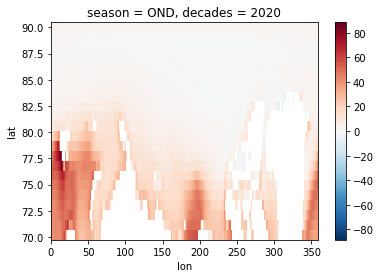

In [168]:
flux_seas_dec_rufmod.isel(season=0,decades=0).plot()

## Plot the results

In [169]:
# make circular boundary for polar stereographic circular plots
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

In [170]:
# set levels and colormaps
if var_in == 'LHFLX':
    levels_in = np.arange(-50,55,5)
    levels_diff = np.arange(-100,110,10)
    cmap_in = plt.cm.get_cmap('coolwarm')
    cmap_diff = plt.cm.get_cmap('bwr') 
if var_in == 'SHFLX':
    levels_in = np.arange(-50,55,5)
    levels_diff = np.arange(-100,110,10)
    cmap_in = plt.cm.get_cmap('coolwarm')
    cmap_diff = plt.cm.get_cmap('bwr') 
if var_in == 'PBLH':
    levels_in = np.arange(0,1050,50)
    levels_diff = np.arange(-10,11,1)
    cmap_in = plt.cm.get_cmap('plasma')
    cmap_diff = plt.cm.get_cmap('bwr') 

Plotting OND 2020s
Plotting OND 2030s
Plotting OND 2040s
Plotting OND 2050s
Plotting OND 2060s
Plotting OND 2070s
Plotting OND 2080s
Plotting OND 2090s
Plotting JFM 2020s
Plotting JFM 2030s
Plotting JFM 2040s
Plotting JFM 2050s
Plotting JFM 2060s
Plotting JFM 2070s
Plotting JFM 2080s
Plotting JFM 2090s
Plotting AMJ 2020s
Plotting AMJ 2030s
Plotting AMJ 2040s
Plotting AMJ 2050s
Plotting AMJ 2060s


/glade/work/duvivier/miniconda3/envs/analysis3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Plotting AMJ 2070s
Plotting AMJ 2080s
Plotting AMJ 2090s
Plotting JAS 2020s
Plotting JAS 2030s
Plotting JAS 2040s
Plotting JAS 2050s
Plotting JAS 2060s
Plotting JAS 2070s
Plotting JAS 2080s
Plotting JAS 2090s


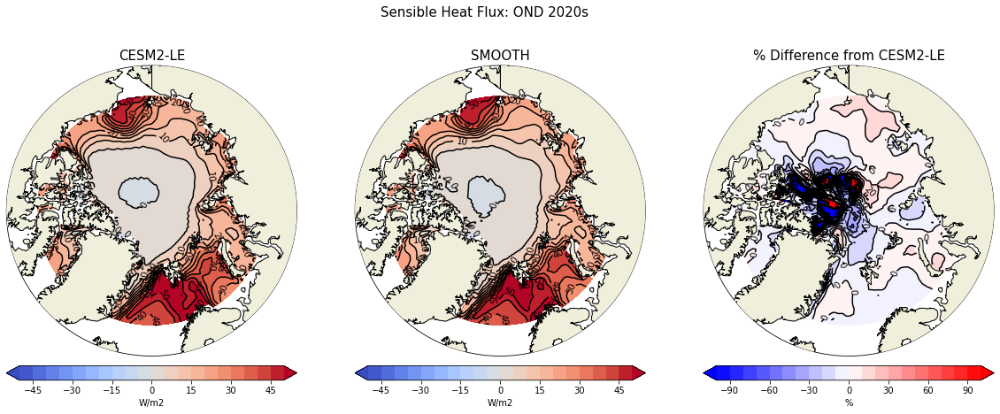

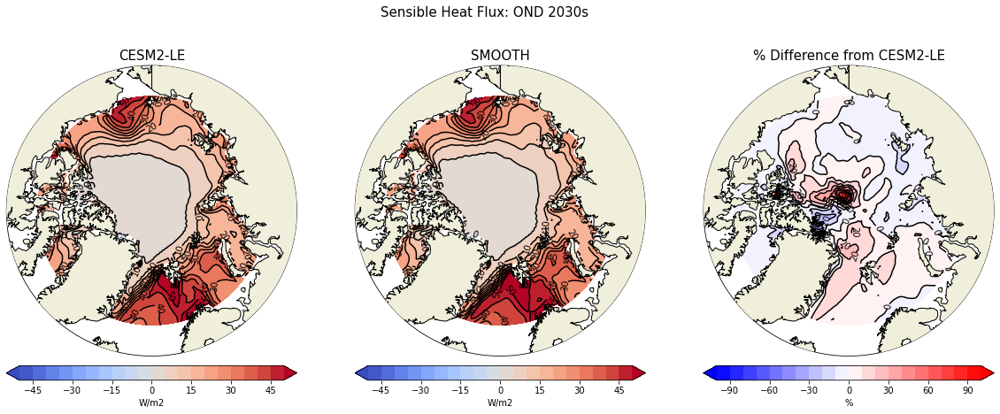

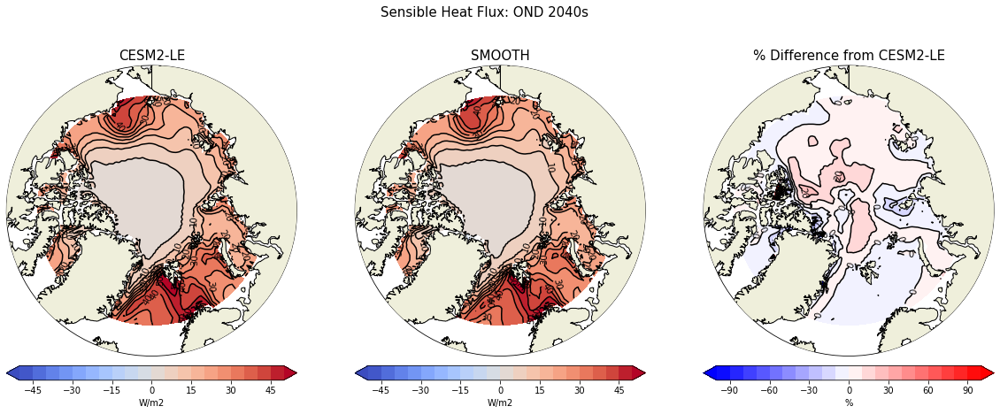

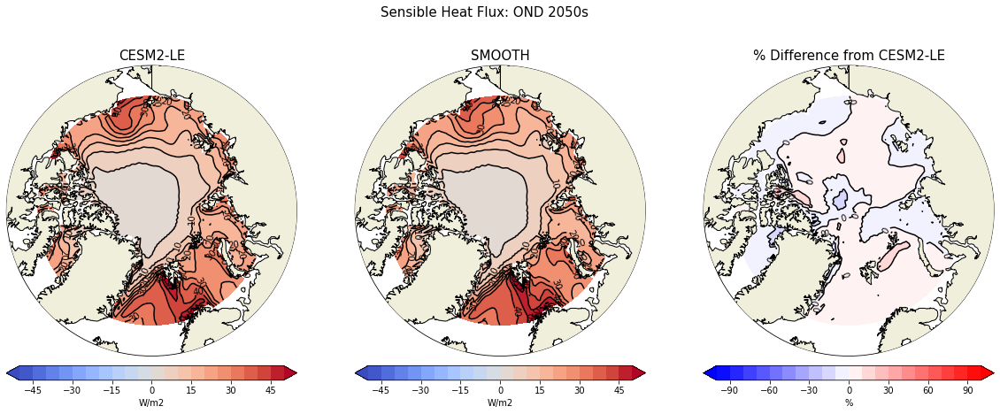

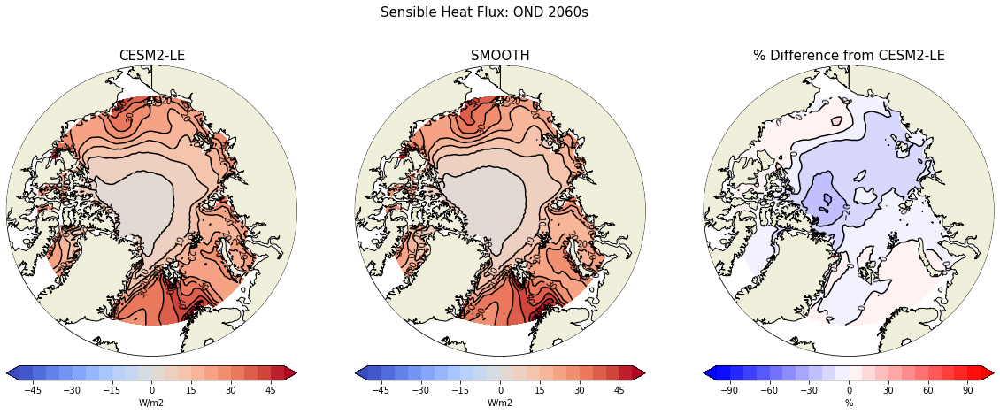

...

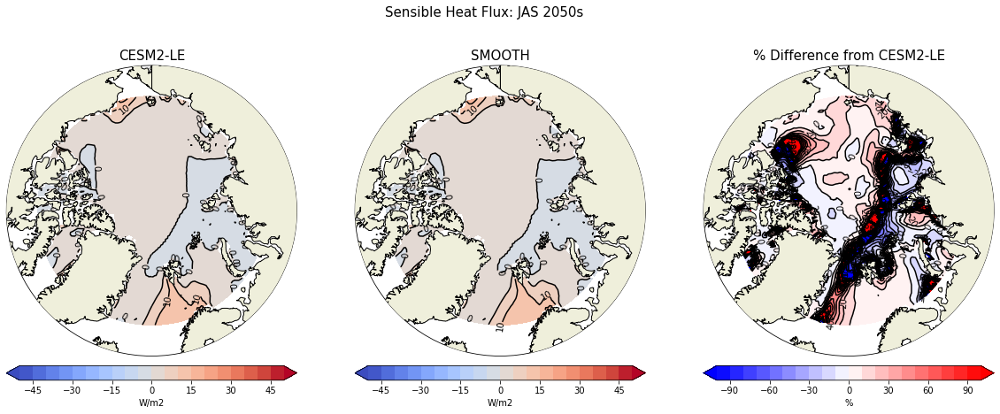

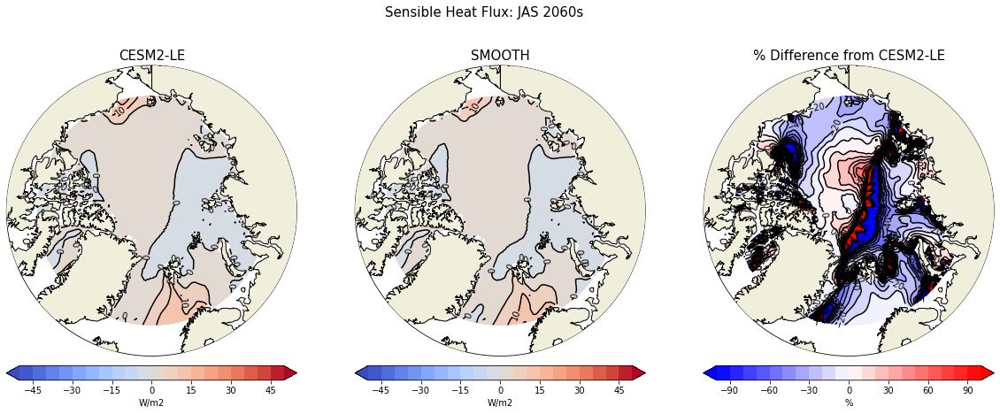

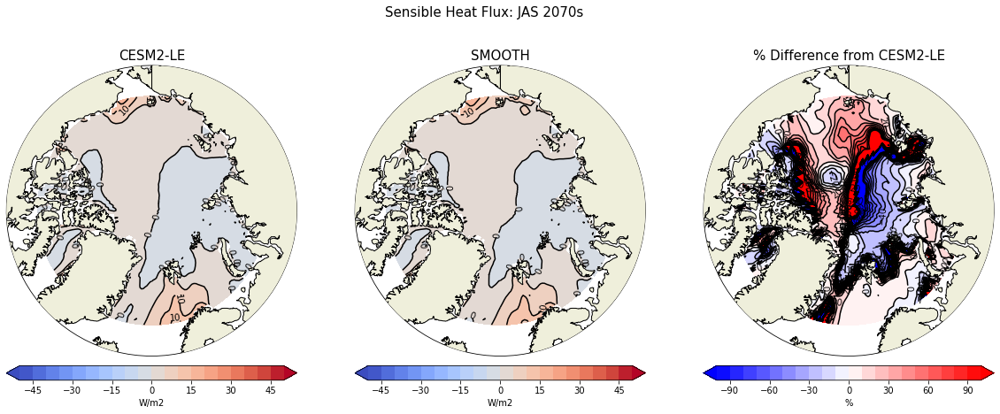

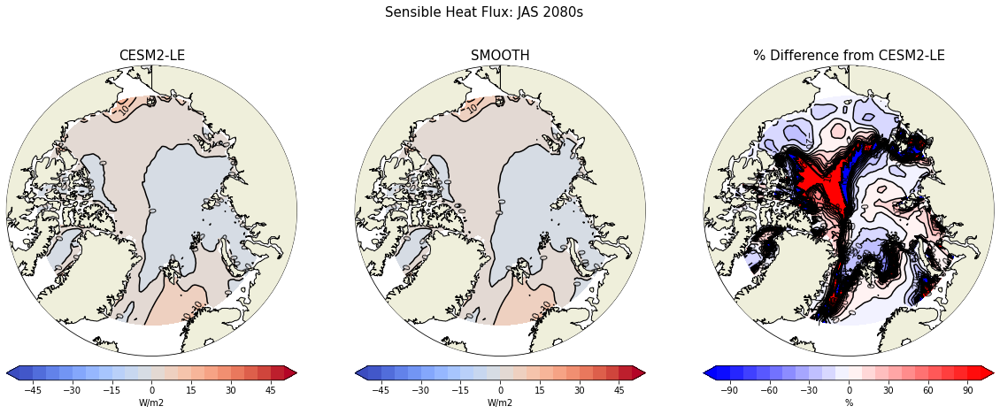

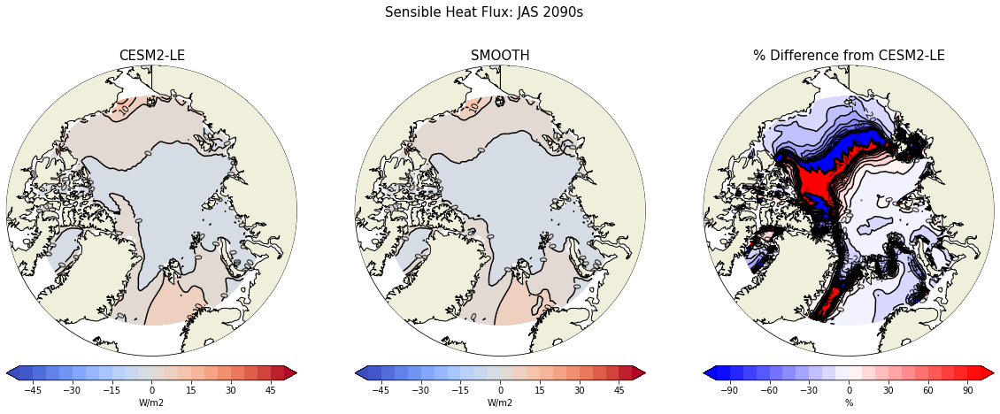

In [171]:
# Loop through the seasons and decades
for ss in season_names:
    for dec in decade_names:
        print('Plotting '+ss+' '+dec+'s')
    
        # select the data
        tmp_le=flux_seas_dec_le.sel(season=ss,decades=dec)
        tmp_rufmod=flux_seas_dec_rufmod.sel(season=ss,decades=dec)
        # calculate % diff
        diff = 100.*((tmp_rufmod - tmp_le)/tmp_le) 
        
        # add cyclic points
        tmp_le = gvutil.xr_add_cyclic_longitudes(tmp_le,"lon")
        tmp_rufmod = gvutil.xr_add_cyclic_longitudes(tmp_rufmod,"lon")
        diff = gvutil.xr_add_cyclic_longitudes(diff,"lon")
        
        # create figure
        fig = plt.figure(figsize=(20,20),linewidth=10)
        # set figure output info
        title = label+': '+ss+' '+dec+'s'
        fout = 'cesm2_le_and_rufmod_difference_decadal_'+var_in+'_'+ss+'_'+dec+'s'
        
        # Make first plot
        ax = plt.subplot(1,3,1,projection = ccrs.NorthPolarStereo() )
        ax.add_feature(cfeature.LAND,zorder=100,edgecolor='k')
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.set_extent([0.005, 360, 90, 65], crs=ccrs.PlateCarree())
        ## plot1
        this=ax.contourf(tmp_le.lon,tmp_le.lat,
                         tmp_le,
                         cmap = cmap_in,
                         levels=levels_in,extend='both',
                         transform=ccrs.PlateCarree())
        plt.colorbar(this,orientation='horizontal',label=units,fraction=0.03,pad=0.01)
        # add contour lines and labels
        this2=ax.contour(tmp_le.lon,tmp_le.lat,
                         tmp_le,
                         colors='black',linestyles='solid',levels=levels_in,
                         transform=ccrs.PlateCarree())
        plt.gca().clabel(this2,this2.levels[::2], inline=True, fontsize=10, colors='black')
        plt.title('CESM2-LE',fontsize=15)

        # Make second plot
        ax = plt.subplot(1,3,2,projection = ccrs.NorthPolarStereo() )
        ax.add_feature(cfeature.LAND,zorder=100,edgecolor='k')
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.set_extent([0.005, 360, 90, 65], crs=ccrs.PlateCarree())
        ## plot speed
        this=ax.contourf(tmp_rufmod.lon,tmp_rufmod.lat,
                         tmp_rufmod,
                         cmap = cmap_in,
                         levels=levels_in,extend='both',
                         transform=ccrs.PlateCarree())
        plt.colorbar(this,orientation='horizontal',label=units,fraction=0.03,pad=0.01)
        # add contour lines and labels
        this2=ax.contour(tmp_rufmod.lon,tmp_rufmod.lat,
                         tmp_rufmod,
                         colors='black',linestyles='solid',levels=levels_in,
                         transform=ccrs.PlateCarree())
        plt.gca().clabel(this2,this2.levels[::2], inline=True, fontsize=10, colors='black')
        plt.title('SMOOTH',fontsize=15)

        # Make last (Diff) plot
        ax = plt.subplot(1,3,3,projection = ccrs.NorthPolarStereo() )
        ax.add_feature(cfeature.LAND,zorder=100,edgecolor='k')
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.set_extent([0.005, 360, 90, 65], crs=ccrs.PlateCarree())
        ## plot speed
        this = ax.contourf(diff.lon,diff.lat,
                           diff,
                           cmap = cmap_diff,
                           levels=levels_diff,extend='both',
                           transform=ccrs.PlateCarree())
        plt.colorbar(this,orientation='horizontal',label="%",fraction=0.03,pad=0.01)
        # add contour lines and labels
        this2=ax.contour(diff.lon,diff.lat,
                         diff,
                         colors='black',linestyles='solid',levels=levels_diff,
                         transform=ccrs.PlateCarree())
        plt.gca().clabel(this2,this2.levels[::2], inline=True, fontsize=10, colors='black')
        plt.title('% Difference from CESM2-LE',fontsize=15)

        # now add final titles
        fig.suptitle(title,fontsize=15, y=0.43) 
        fig = plt.savefig(fout+'.png', bbox_inches='tight', dpi=200)
        
